# Assignment3

1. sklearn 패키지를 사용해 로지스틱 회귀모형으로 데이터를 분석해 주세요 
2. 성능지표를 계산하고 이에 대해 해석해 주세요 
   - sklearn : mean accuracy, f1 score 등 다양한 성능지표 계산 
   - confusion matrix : tp, fp, fn, tn 값을 통해 성능지표 계산  
3. 어떤 성능지표를 기준으로 성능을 개선을 시도했고, 그러한 선택의 이유를 적어주세요.
4. **해석을 상세하게 달아주세요 !**

## Data 

출처 : https://www.kaggle.com/mlg-ulb/creditcardfraud


* V1 ~ V28 : 비식별화 된 개인정보 
* **Class** : Target 변수  
  - 1 : fraudulent transactions (사기)
  - 0 : otherwise 

In [2]:
import pandas as pd
import numpy as np

In [3]:
credit = pd.read_csv("assignment3_creditcard.csv")

In [4]:
credit.head()

,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,...,V20,V21,V22,V23,V24,V25,V26,V27,V28,Class
0,-1.848212,2.384900,0.379573,1.048381,-0.845070,2.537837,-4.542983,-10.201458,-1.504967,-2.234167,...,2.585817,-5.291690,0.859364,0.423231,-0.506985,1.020052,-0.627751,-0.017753,0.280982,0
1,2.071805,-0.477943,-1.444444,-0.548657,0.010036,-0.582242,-0.042878,-0.247160,1.171923,-0.342382,...,-0.077306,0.042858,0.390125,0.041569,0.598427,0.098803,0.979686,-0.093244,-0.065615,0
2,-2.985294,-2.747472,1.194068,-0.003036,-1.151041,-0.263559,0.553500,0.635600,0.438545,-1.806488,...,1.345776,0.373760,-0.385777,1.197596,0.407229,0.008013,0.762362,-0.299024,-0.303929,0
3,-1.479452,1.542874,0.290895,0.838142,-0.529290,-0.717661,0.484516,0.545092,-0.780767,0.324804,...,0.038397,0.116771,0.405560,-0.116453,0.541275,-0.216665,-0.415578,0.027126,-0.150347,0
4,-0.281976,-0.309699,-2.162299,-0.851514,0.106167,-1.483888,1.930994,-0.843049,-1.249272,1.079608,...,-0.875516,-0.004199,1.015108,-0.026748,0.077115,-1.468822,0.751700,0.496732,0.331001,0


## EDA

데이터를 간단하게 확인해 보고자 한다.

In [5]:
import matplotlib.pyplot as plt
import seaborn as sns

In [6]:
target = credit.Class
data = credit.drop('Class', axis=1)

`target` 데이터는 0과 1 두 위치에 존재하고 있는 것을 확인할 수 있었다.

In [7]:
target.value_counts()

0    28432
1      246
Name: Class, dtype: int64

target 데이터의 수가 많이 편향된 것을 확인할 수 있다.

데이터의 값이 한 쪽에 편향된 경우, 모델이 사기가 아니다(0) 인 쪽에 큰 비중을 두고 추정을 하게 될 위험이 있기 때문에, 차후 수정해 보고자 한다.

<AxesSubplot:>

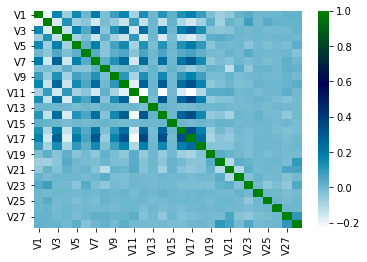

In [24]:
sns.heatmap(data = data.corr(), cmap='ocean_r')

대부분의 변수는 낮은 상관관계를 가지고 있는 것으로 추정이 된다.

In [8]:
data.describe()

,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,...,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28
count,28678.000000,28678.000000,28678.000000,28678.000000,28678.000000,28678.000000,28678.000000,28678.000000,28678.000000,28678.000000,...,28678.000000,28678.000000,28678.000000,28678.000000,28678.000000,28678.000000,28678.000000,28678.000000,28678.000000,28678.000000
mean,-0.015438,0.053653,-0.046031,0.037348,-0.033724,-0.003299,-0.051054,0.006064,-0.018530,-0.041149,...,0.007183,0.002633,0.010289,-0.000656,-0.004800,-0.000897,-0.001989,-0.000765,0.000948,0.001535
std,2.031529,1.616186,1.758169,1.482109,1.486998,1.339259,1.454827,1.364342,1.134065,1.252593,...,0.827420,0.720307,0.847152,0.739469,0.593663,0.603349,0.517968,0.483852,0.397075,0.296736
min,-30.552380,-42.172688,-31.103685,-5.560118,-42.147898,-21.929312,-41.506796,-39.267378,-13.434066,-24.403185,...,-4.619034,-21.387122,-21.453736,-8.887017,-36.666000,-2.718024,-6.712624,-2.241620,-7.418878,-9.617915
25%,-0.916927,-0.575381,-0.899872,-0.843321,-0.714901,-0.763757,-0.568146,-0.206103,-0.661909,-0.543450,...,-0.459073,-0.209678,-0.225520,-0.539244,-0.160583,-0.356047,-0.318619,-0.327343,-0.070558,-0.052189
50%,0.020050,0.075358,0.180610,-0.008844,-0.060040,-0.271363,0.036107,0.022463,-0.055095,-0.097390,...,0.002111,-0.062792,-0.028778,0.007302,-0.011199,0.040006,0.019770,-0.056260,0.002049,0.011075
75%,1.317461,0.806957,1.029928,0.771958,0.613328,0.397269,0.559409,0.329606,0.605704,0.460681,...,0.467781,0.131199,0.184312,0.526358,0.146835,0.437146,0.352717,0.240713,0.091637,0.078911
max,2.399484,21.467203,4.069865,11.927512,32.911462,22.529298,36.677268,20.007208,8.113152,15.236028,...,5.228342,26.237391,27.202839,8.361985,9.637187,3.948061,2.510401,3.122747,11.135740,14.929133


`V1` ~ `V2` 는 수치상 큰 차이는 없어 이미 정규화를 진행한 것으로 추정되나, 해서 나쁠 건 없기에 한번 시도해 보았다.

In [26]:
from sklearn.preprocessing import StandardScaler

In [30]:
scaler = StandardScaler()
scaled_data = scaler.fit_transform(data)

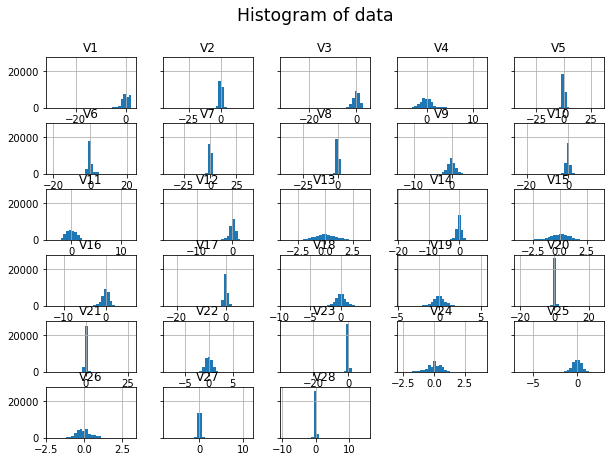

In [37]:
data.hist(figsize=(10,7), bins=30,sharey=True)
plt.suptitle("Histogram of data", size='xx-large')
plt.show()

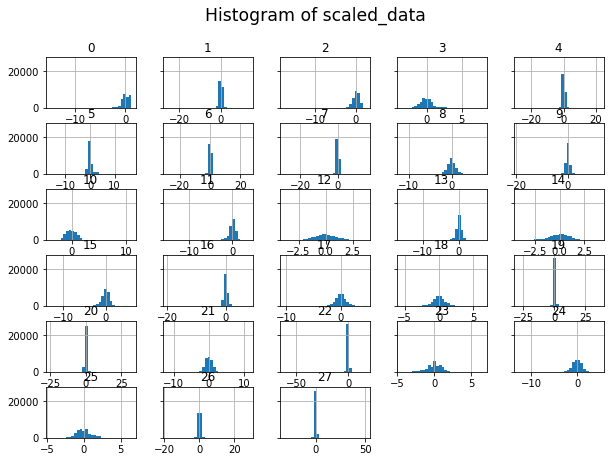

In [36]:
pd.DataFrame(scaled_data).hist(figsize=(10,7), bins=30, sharey=True)
plt.suptitle("Histogram of scaled_data", size='xx-large')
plt.show()

모양의 차이가 거의 없는 것으로 볼 때 주어진 데이터는 이미 정규화 처리가 완료된 상태라고 생각됐다.

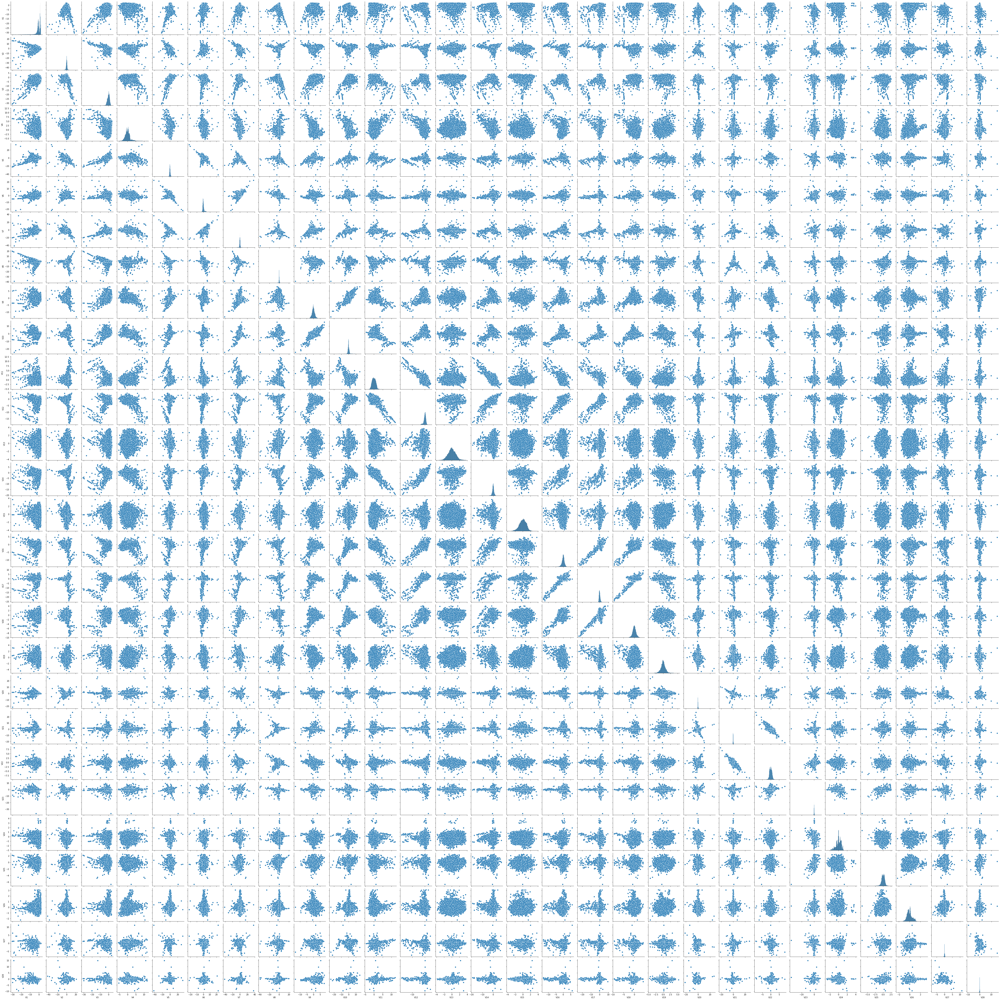

In [40]:
sns.pairplot(data)

변수 간 상관관계가 있을 것으로 예상되는 변수들이 몇 개 관측되었다.

`V16`, `V17` 등에서 데이터가 상관관계가 있는 것으로 의심되었다.

따라서 데이터가 선형 관계에 있다고 가정하고 임의로 상관관계가 있는지 확인해 보았다.

VIF를 통해 다중공선성 체크를 해 주고자 한다.

(나중에 체크해 보니, 분류문제에 대해서는 VIF를 진행하는 것이 의미가 없을 것이라는 예상이 있었다. - 단순 참고용일듯 하다.)

In [43]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

vif = pd.DataFrame()
vif["VIF"] = [variance_inflation_factor(data.values, i) for i in range(data.shape[1])]
vif["features"] = data.columns
vif.sort_values(["VIF"], ascending=[False])

,VIF,features
16,1.473739,V17
11,1.296714,V12
13,1.293582,V14
9,1.255330,V10
6,1.241540,V7
15,1.223054,V16
2,1.213977,V3
0,1.132835,V1
1,1.121297,V2
10,1.114845,V11


확인 결과 다중공선성을 크게 띄지 않았다.
다른 전처리 과정 없이 회귀분석을 진행해도 될 것 같다

# Logistic Regression

`target` 변수값이 이진(0과 1) 이므로 로지스틱 회귀분석을 진행해 보았다.

In [32]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split

In [33]:
# 데이터를 학습용과 평가용으로 분류함
X_train, X_test, y_train, y_test = train_test_split(data, target, random_state=0)

In [34]:
model = LogisticRegression(penalty= "none") # 로지스틱 회귀모델 생성
result = model.fit(X_train, y_train) # 모델 학습(fitting)

In [35]:
# 예측값을 불러옴
pred = model.predict(X_test)
print(pred)

[0 0 0 ... 0 0 0]


In [36]:
# mean accuracy 체크
model.score(X_test, y_test)

0.997907949790795

입력값과 출력값 비교

In [37]:
# 분류될 확률. (0으로 분류될 확률, 1로 분류될 확률)
prob = [p[1] for p in model.predict_proba(X_test)]

In [38]:
prediction_df = pd.DataFrame({
    'y_test' : y_test,
    'y_pred' : pred,
    'prob' : prob,
})

prediction_df.tail(30)

,y_test,y_pred,prob
13410,0,0,0.000219
16098,0,0,0.001984
19786,0,0,0.001149
24409,0,0,0.001401
1426,0,0,0.000124
18813,0,0,0.000144
9391,0,0,0.000275
15747,0,0,0.004648
21573,0,0,0.000114
12905,0,0,0.001111


## Cross Entropy
교차 엔트로피 오차는 분류문제에서 사용하는 오차의 방식.
이산적인 확률분포이기 때문에 MSE 보다 잘못 예측한 것에 대한 결과값을 사용하는 것이 맞다.

In [39]:
from sklearn.metrics import log_loss

print(log_loss(y_test, pred))

0.0722573004621183


## Model evaluation

`confusion Matrix` 를 먼저 구한 뒤에 이를 기반으로 값들을 구해 보려고 한다. 

In [40]:
from sklearn.metrics import confusion_matrix, f1_score

In [41]:
# test 데이터에 대한 confusion_matrix 를 구한다.
confusion_matrix(y_test, pred)

array([[7114,    4],
       [  11,   41]])

`cunfusion_matrix()` 로 생성한 행렬은 다음 구성을 따른다.

|TN | FP |

|FN | TP |

- TN : True negative (실제도 0이고, 예측값도 0이다.)
- FP : False positive (실제는 0이지만, 예측값은 1이다.)
- FN : False negative (실제는 1이고, 예측값은 0이다.)
- TP : True pegative (실제도 1이고 예측값도 1이다.)

In [42]:
(tn, fp), (fn, tp) = confusion_matrix(y_test, pred)

In [43]:
p = fn + tp
n = tn + fp

### Accuracy(정확도)
가장 대중적인 지표.
전체 데이터중에서 맞게 분류된 데이터의 비율

In [44]:
accuracy = (tp + tn) / (p + n)
print("Accuracy : ", accuracy) # mean accuracy 이다.

Accuracy :  0.997907949790795


### Error Rate
Accuracy 의 반대 값이다.

전체 데이터 중에서 잘못 분류한 값의 비율이다.

In [45]:
errorRate = (fn + fp) / (p+n)
print("Error Rate : ", errorRate ) # 1 - accuracy 정도 될 것으로 추정된다.

Error Rate :  0.0020920502092050207


### Recall(Sensitivity : 재현률)
원래 positive 데이터에서 positive 로 분류된 수를 의미한다.

즉 원래 1이었던 데이터 중 약 0.21 비율의 데이터는 잘못 예측되었다.

In [46]:
recall = (tp) / p
print("Recall : ", recall)

Recall :  0.7884615384615384


### Precision (정밀도)
Positive 로 예측한 데이터 중에 실제 positive 인 비율이다.

즉 positive(1)로 예측된 값 중에서 0.09 비율 정도의 데이터는 잘못 예측되었다.

In [47]:
precision = tp/ (tp + fp)
print("precision : ", precision)

precision :  0.9111111111111111


### Specificity(특이도)

negative로 판단한 내용 중에 실제 negative 인 비율이다.
매우 적은 수의 데이터가 0으로 잘못 판단되었다.

In [48]:
specificity =  tn / (tn + fp)
print("specificity : ", specificity)

specificity :  0.9994380443944928


### False Positive Rate (위양성률)
Negative 로 판단한 값 중에 잘못 판단한 비율(실제로는 positive)이다.

In [49]:
fpr = fp / n
print("FPR : ", fpr ) # 1 - specificity 와 같다

FPR :  0.000561955605507165


### f1_score
Recall과 Precision의 조화평균.
가중치가 1이어서 f1 점수라고 한다.

In [50]:
f1 = f1_score(pred, y_test)
print("f1 : ", f1)

f1 :  0.845360824742268


In [51]:
# 다음 방법으로 전체 성능을 확인할 수도 있다.
from sklearn.metrics import classification_report

print(classification_report(y_test, pred, target_names=['otherwise', 'fraudulent transactions']))

                         precision    recall  f1-score   support

              otherwise       1.00      1.00      1.00      7118
fraudulent transactions       0.91      0.79      0.85        52

               accuracy                           1.00      7170
              macro avg       0.95      0.89      0.92      7170
           weighted avg       1.00      1.00      1.00      7170



## ROC 커브
ROC 커브는 모델의 임계값을 조정한다.

임계값을 조정하면, 거래가 사기 거래로 판정되는 기준이 조금 완화된다. 즉 사기 거래로 판정되는 것이 조금 증가할 것이다.

In [52]:
from sklearn.metrics import roc_curve

new_fpr, tpr, thresholds = roc_curve(y_test, model.decision_function(X_test))

In [53]:
print(f"fpr: {new_fpr} \n tpr : {tpr} \n thres : {thresholds}")

fpr: [0.00000000e+00 0.00000000e+00 0.00000000e+00 1.40488901e-04
 1.40488901e-04 2.80977803e-04 2.80977803e-04 5.61955606e-04
 5.61955606e-04 7.02444507e-04 7.02444507e-04 1.12391121e-03
 1.12391121e-03 1.54537792e-03 1.54537792e-03 1.96684462e-03
 1.96684462e-03 6.32200056e-03 6.60297836e-03 1.93874684e-02
 1.93874684e-02 2.99241360e-02 2.99241360e-02 3.13290250e-01
 3.13571228e-01 3.13992695e-01 3.14273672e-01 3.26355718e-01
 3.26777185e-01 3.61477943e-01 3.61758921e-01 5.29783647e-01
 5.30064625e-01 5.57881427e-01 5.58302894e-01 6.81652149e-01
 6.81933127e-01 7.19724642e-01 7.20005620e-01 8.51222253e-01
 8.51503231e-01 8.98567013e-01 8.98847991e-01 9.92694577e-01
 9.92975555e-01 1.00000000e+00] 
 tpr : [0.         0.01923077 0.53846154 0.53846154 0.55769231 0.55769231
 0.75       0.75       0.82692308 0.82692308 0.86538462 0.86538462
 0.90384615 0.90384615 0.94230769 0.94230769 0.96153846 0.96153846
 0.96153846 0.96153846 0.98076923 0.98076923 1.         1.
 1.         1.         1

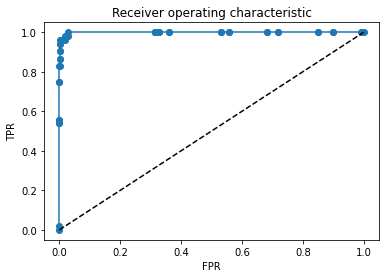

In [54]:
plt.plot(new_fpr, tpr, 'o-')
plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('FPR')
plt.ylabel('TPR')
plt.title('Receiver operating characteristic')
plt.show()

### AUC
AUC는 ROC 곡선 아래의 너비이다.
1에 가까울 수록 좋은 모델이다.

In [55]:
from sklearn.metrics import auc

In [56]:
auc(new_fpr, tpr)

0.9987842306611623

# 성능 개선

`classification_report()` 를 통해 확인해 본 결과, True(1) 값에 대한 f1-score가 낮게 나온 것을 확인할 수 있다.
즉 FPR이 낮은 것이 문제라고 볼 수 있다.

즉 사기가 아니라고 생각하는 임계값이 매우 낮게 설정되어, 사기가 아니라는 (0) 값으로 추정하는 경우가 매우 많아지는 것으로 추정된다.

이는 28432 : 246 의 비율로 사기가 아닌 값이 매우 많기 때문에 생기는 문제로 생각된다.


In [57]:
prediction_df[prediction_df['y_test'] == 0].sort_values('prob', ascending=False).head(10)

,y_test,y_pred,prob
17372,0,1,0.994538
1804,0,1,0.986372
20945,0,1,0.636291
6095,0,1,0.611328
11021,0,0,0.396770
3015,0,0,0.236752
14414,0,0,0.194870
23663,0,0,0.181132
23017,0,0,0.115138
2011,0,0,0.113777


In [58]:
prediction_df[prediction_df['y_test'] == 1].sort_values('prob').head(10)

,y_test,y_pred,prob
23709,1,0,0.010042
10344,1,0,0.013609
15079,1,0,0.074034
4244,1,0,0.096895
21734,1,0,0.097766
12997,1,0,0.138734
1584,1,0,0.167722
4379,1,0,0.263061
3998,1,0,0.271519
13761,1,0,0.437575


데이터의 결과를 표시해 봐도 같은 결과가 나타난다.
0인데 1로 잘못 예측한 경우는 전체에서 4건 밖에 되지 않았으나
1인데 0으로 잘못 예측한 경우는 상대적으로 많이 있었다.


따라서 AUC를 기준으로 성능 개선을 해보고자 한다.

### 정규화 방법
정규화 방법을 바꿔서 0을 도출하는 데 영향을 주는 값을 조정하려 시도해 봤지만, 모델에 차이가 없었다.

### solver 방법
같은 이유로 문제를 푸는 방식을 변경해 보았다. 약간의 성능 향상이 있었으나, 드라마틱한 차이가 나지는 않았다.

In [59]:
model2 = LogisticRegression(solver= "saga") # solver 를 변경했다.
result = model2.fit(X_train, y_train) # 모델 학습(fitting)
pred2 = model2.predict(X_test)

/usr/local/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


In [60]:
print(classification_report(y_test, pred2, target_names=['otherwise', 'fraudulent transactions']))

                         precision    recall  f1-score   support

              otherwise       1.00      1.00      1.00      7118
fraudulent transactions       0.91      0.83      0.87        52

               accuracy                           1.00      7170
              macro avg       0.96      0.91      0.93      7170
           weighted avg       1.00      1.00      1.00      7170



`fraudulent transactions` 의 `recall` 이 약간 증가했다. 이에 따라 `f1-score` 도 같이 증가한 것이 확인이 된다.

In [61]:
new_fpr, tpr, thresholds = roc_curve(y_test, model2.decision_function(X_test))

In [62]:
auc(new_fpr, tpr) # 아주 약간 올라갔다.

0.9989328246914648

## Class Weight
서치 중에 `Class Weight` 를 줌으로서 데이터셋의 불균형을 해소할 수 있다는 이야기를 들었다.

따라서 `sklearn` 모델에서 클래스 가중치를 두어 보았다

In [81]:
# 데이터셋 분포 획인
target.value_counts()

0    28432
1      246
Name: Class, dtype: int64

28432개의 0과 246의 1이 있다.

따라서 0의 가중치는 246 / (28432 + 246) 으로 설정하고, 1의 가중치는 그 반대로 설정한다.

In [82]:
model3 = LogisticRegression(class_weight={0: 246 / (28432 + 246), 1 : 28432 / (28432 + 246) }) # solver 를 변경했다.
result3 = model3.fit(X_train, y_train) # 모델 학습(fitting)
pred3 = model3.predict(X_test)

In [84]:
print(classification_report(y_test, pred3, target_names=['otherwise', 'fraudulent transactions']))

                         precision    recall  f1-score   support

              otherwise       1.00      0.98      0.99      7118
fraudulent transactions       0.23      1.00      0.38        52

               accuracy                           0.98      7170
              macro avg       0.62      0.99      0.68      7170
           weighted avg       0.99      0.98      0.98      7170



In [85]:
new_fpr, tpr, thresholds = roc_curve(y_test, model3.decision_function(X_test))
auc(new_fpr, tpr)

0.9991462597531718

In [87]:
model3.score(X_test, y_test)

0.9762900976290098

모델의 accuracy 는 살짝 내려간 모습을 보이나, auc는 증가한 것을 확인할 수 있었다.

또한 사기인 것을 잡아내는 비율인 `recall` 은 1.00으로 기록되어 사기 데이터는 모두 사기로 분류된 것을 확인할 수 있다.

피해 발생을 사전에 잡는다는 점에서 조금이라도 의심이 가는 거래는 (사기 거래가 아닐지라도) 우선 사기로 판정하는 것이 안전할 것으로 판단된다. 즉 모델의 성능이 개선되었다고 볼 수 있다.